In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import requests, time, csv, argparse, os, warnings

from datetime import datetime
from bs4 import BeautifulSoup, NavigableString, Tag
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager

from tqdm import tqdm
from bertopic import BERTopic

In [2]:
file_name = 'new_paper_data.csv'

with webdriver.Chrome(service=Service(ChromeDriverManager().install())) as driver: # driver_version='116.0.5845.110'
    driver.set_window_size(1024, 600)
    driver.maximize_window()

    for page_num in tqdm(range(475, 529)):
        URL = f'https://www.webofscience.com/wos/woscc/summary/36906712-7690-48d6-9bc5-b8da7bcb73c6-afbeefe1/date-descending/{page_num}'
    
        driver.get(URL)
        driver.implicitly_wait(10)
    
        ## 모든 정보를 가져오기 위해서, Scroll이 필요
        last_page_height = driver.execute_script("return document.documentElement.scrollHeight")
        stand_height, sub_height = 0, last_page_height
        while True:
            # 너무 빠르게 스크롤 되면, 갱신이 잘 안되므로 천천히 스크롤 해서 정보를 받아주기
            for i in range(10):
                driver.execute_script(f"window.scrollTo(0, {stand_height + (sub_height/10 * i)});")
                time.sleep(0.5)
            time.sleep(0.5)
    
            # 스크롤을 내린 페이지의 높이 및 기존 위치와 이전과 차이값 정보를 갱신
            new_page_height = driver.execute_script("return document.documentElement.scrollHeight")
            stand_height, sub_height = last_page_height, new_page_height - last_page_height
            
            # 무한 스크롤이 완료된 경우 (스크롤이 가장 아래까지 도달하여 높이 변화가 없는 경우)
            if last_page_height == new_page_height: break
            # 무한 스크롤이 완료되지 않은 경우 (new_page_height의 값이 계속해서 갱신되는 경우)
            else: last_page_height = new_page_height
            time.sleep(0.5)
     
        ## Scroll이 완료된 후, paper의 정보 가져오기
        paper_lst = driver.find_elements(By.XPATH, '/html/body/app-wos/main/div/div/div[2]/div/div/div[2]/app-input-route/app-base-summary-component/div/div[2]/app-records-list/app-record')
    
        ## 각각 하나의 paper에 대한 세부 정보 추출하기
        for idx, element in enumerate(paper_lst):
            paper_dic = {'title': '', 'date': '', 'j_c_name': ''}
            # print('start', idx)
            
            try:
                
                try: title = element.find_element(By.XPATH, 'div/div/div[2]/div[1]/app-summary-title/h3/a').text
                except: continue
                    
                try: date = element.find_element(By.XPATH, 'div/div/div[2]/div[1]/div[1]/span[1]').text
                except: date = element.find_element(By.XPATH, 'div/div/div[2]/div[1]/div[2]/span[1]').text

                try: j_c_name = element.find_element(By.XPATH, 'div/div/div[2]/div[1]/div[1]/app-jcr-sidenav/mat-sidenav-container/mat-sidenav-content/span/a').text
                except: j_c_name = element.find_element(By.XPATH, 'div/div/div[2]/div[1]/div[2]/app-jcr-sidenav/mat-sidenav-container/mat-sidenav-content/span/span').text
                
                paper_dic['title'] = [title]
                paper_dic['date'] = [date]
                paper_dic['j_c_name'] = [j_c_name]
                # print('paper_dic', paper_dic)

                if (paper_dic['title'] != '') & (paper_dic['date'] != '') & (paper_dic['j_c_name'] != ''):
                    pd.DataFrame(paper_dic).to_csv(file_name, index=False, mode='a', header=(not os.path.exists(file_name)), encoding='UTF-8-sig')
                    # print('to_csv')
                else: continue
            except: pass

In [3]:
df = pd.read_csv('new_paper_data.csv')
df = df.drop_duplicates('title').reset_index(drop=True)
df['title'] = df['title'].str.lower()
docs = df['title'].to_list()

In [4]:
topic_model = BERTopic()
topics, probs = topic_model.fit_transform(docs) 

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [5]:
topic_model.visualize_topics()

In [6]:
from sentence_transformers import SentenceTransformer
from bertopic import BERTopic
from umap import UMAP

# Prepare embeddings
sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = sentence_model.encode(docs, show_progress_bar=False)

# Train BERTopic
topic_model = BERTopic().fit(docs, embeddings)

# Run the visualization with the original embeddings
topic_model.visualize_documents(docs, embeddings=embeddings)

reduced_embeddings = UMAP(n_neighbors=15, min_dist=0.25, metric='cosine').fit_transform(embeddings)
topic_model.visualize_documents(docs, reduced_embeddings=reduced_embeddings, hide_annotations=True)

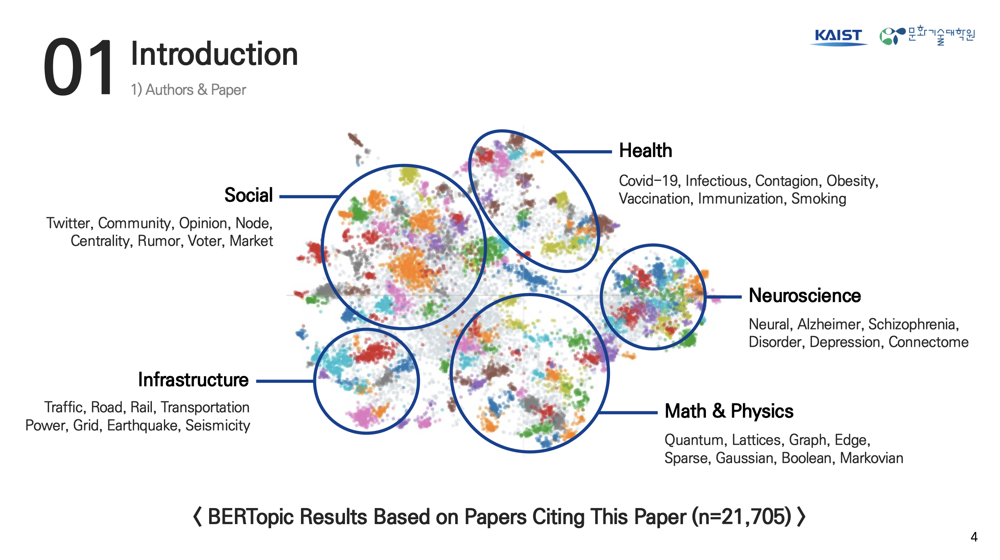

In [7]:
date_df = pd.DataFrame({
    #2023: [965], 
    2022: [1523],
    2021: [1787], 
    2020: [1712], 
    2019: [1724], 
    2018: [1621], 
    2017: [1671], 
    2016: [1645], 
    2015: [1708], 
    2014: [1621], 
    2013: [1377], 
    2012: [1296], 
    2011: [1098],
    2010: [995], 
    2009: [1173], 
    2008: [1027], 
    2007: [945], 
    2006: [767], 
    2005: [525], 
    2004: [467], 
    2003: [278], 
    2002: [206], 
    2001: [124], 
    2000: [69], 
    1999: [33], 
    1998: [3]
}).T.reset_index()

date_df.columns = ['year', 'count']
date_df['year'] = date_df['year'].astype('str').astype('datetime64[ns]')
date_df

,year,count
0,2022-01-01,1523
1,2021-01-01,1787
2,2020-01-01,1712
3,2019-01-01,1724
4,2018-01-01,1621
5,2017-01-01,1671
6,2016-01-01,1645
7,2015-01-01,1708
8,2014-01-01,1621
9,2013-01-01,1377


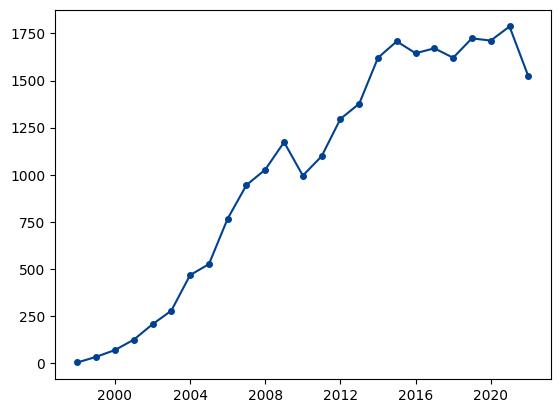

In [8]:
plt.plot(date_df['year'], date_df['count'], marker='o', markersize=4, color='#004191')
# plt.savefig('time_series.png')